In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import pandas as pd
from scipy.optimize import curve_fit
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from typing import Any, List
from scipy.interpolate import make_smoothing_spline
from matplotlib.colors import LinearSegmentedColormap
import plotly.graph_objects as go

In [2]:
oae = xr.open_dataset("c:\\Users\\junsu\\my_project\\data\\OAE_efficiency_maps_alltime.nc")

oae_df = oae.to_dataframe()
oae_df = oae_df.reset_index().pivot(
    index="N_month", columns=["TLAT", "TLONG", "season", "nlat"], values="OAE_efficiency"
)
oae_df.dropna(axis=1, how="all", inplace=True)
oae_diffed = oae_df - oae_df.shift().fillna(0)

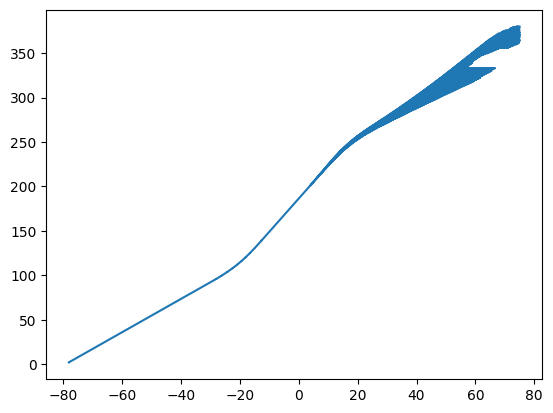

In [3]:
plt.plot(oae_df.columns.get_level_values(0), oae_df.columns.get_level_values(3))

N_month
0      0.028776
1      0.042606
2      0.052881
3      0.043742
4      0.036604
         ...   
175    0.000080
176    0.000256
177    0.000665
178    0.000088
179    0.000247
Length: 180, dtype: float64

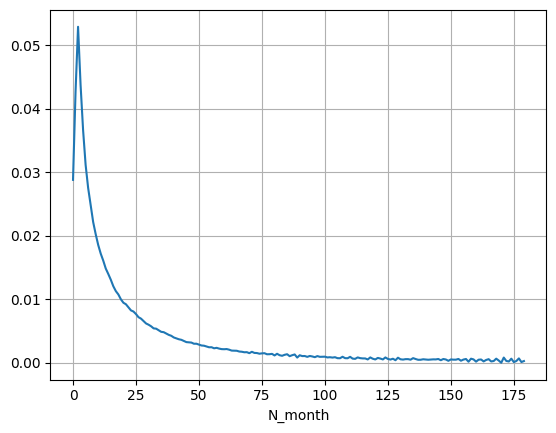

In [4]:
oae_diffed.mean(axis=1).plot(legend=False, grid=True)
oae_diffed.mean(axis=1)

# Data

In [5]:
def partition_sorted_values_by_count(values: pd.Index, n_buckets: int) -> List[List[Any]]:
    """
    Partition unique values into n buckets such that:
    - Each bucket contains unique values in sorted order.
    - The total count of values (frequency) in each bucket is approximately equal.
    - The buckets are ordered: all values in bucket[i] < values in bucket[i+1].

    :param values: A pandas Index containing values (e.g., from df.columns.get_level_values(0)).
    :param n_buckets: Number of buckets to split the values into.
    :return: A list of n lists, where each list contains unique values assigned to that bucket.
    """
    value_counts = values.value_counts()
    sorted_values = sorted(value_counts.index)
    items = [(val, value_counts[val]) for val in sorted_values]

    total = sum(count for _, count in items)
    target = total / n_buckets

    buckets = []
    current_bucket = []
    current_sum = 0

    for val, count in items:
        if current_sum + count > target and len(buckets) < n_buckets - 1:
            buckets.append(current_bucket)
            current_bucket = []
            current_sum = 0
        current_bucket.append(val)
        current_sum += count

    buckets.append(current_bucket)

    print("Bucket summary:")
    for i, bucket in enumerate(buckets):
        bucket_count = sum(value_counts[val] for val in bucket)
        print(f"Bucket {i+1}: {bucket} (total count: {bucket_count})")
    return buckets

In [6]:
lat_bucket_num = 10
lat_buckets = partition_sorted_values_by_count(oae_diffed.columns.get_level_values(0), lat_bucket_num)

Bucket summary:
Bucket 1: [-78.15208991787753, -78.1520899178775, -77.61787338014501, -77.08365664130845, -76.5494396932739, -76.01522252801996, -75.48100513760106, -74.94678751414969, -74.41256964987944, -73.87835153708762, -73.8783515370876, -73.34413316815792, -73.34413316815791, -72.80991453556312, -72.8099145355631, -72.2756956318676, -71.7414764497301, -71.74147644973007, -71.2072569819061, -71.20725698190607, -70.67303722125033, -70.13881716071951, -69.60459679337451, -69.60459679337448, -69.60459677731096, -69.07037611238285, -69.07037609597498, -68.53615511102117, -68.53615511102116, -68.53615509427466, -68.00193378267747, -68.00193376559817, -67.46771212085338, -67.46771210344724, -66.93349011916659, -66.93349011916658, -66.9334901014396, -66.39926777135284, -66.39926775331121, -65.86504507126828, -65.86504507126827, -65.86504505291829, -65.33082201289153, -65.33082201289152, -65.33082199423953, -64.79659859032579, -64.79659859032577, -64.79659857137827, -64.26237479780083, -

## Empirical Analysis

In [7]:
truncate = 2
total_lat_number = len(oae_diffed.columns.get_level_values(0).unique())

month_tuple = ("January", "April", "July", "October")

acf_term_structure = dict(
    total= np.zeros((len(oae_diffed) - truncate)),
)
acf_term_structure.update(
    {month.lower(): np.zeros((len(oae_diffed) - truncate)) for month in month_tuple}
)
acf_term_structure.update(
    {f"lat_{np.mean(lat_bucket)}": np.zeros((len(oae_diffed) - truncate)) for lat_bucket in lat_buckets}
)
acf_term_structure.update(
    {month.lower() + f"_lat_{np.mean(lat_bucket)}": np.zeros((len(oae_diffed) - truncate)) for month in month_tuple for lat_bucket in lat_buckets}
)

r_sq_term_structure = {
    k: np.zeros((len(oae_diffed) - truncate)) for k in acf_term_structure.keys()
}
tss_term_structure = {
    k: np.zeros((len(oae_diffed) - truncate)) for k in acf_term_structure.keys()
}

np.zeros((len(oae_diffed) - truncate))

lat_idx = oae_diffed.columns.get_level_values(0)
for i in range(len(oae_diffed) - truncate):
    ar1_model = sm.OLS(oae_diffed.iloc[i+1], oae_diffed.iloc[i], missing="drop")
    ar1_model_fitted: sm.regression.linear_model.RegressionResults = ar1_model.fit()
    acf_term_structure["total"][i] = ar1_model_fitted.params.values[0]
    tss_term_structure["total"][i] = ar1_model_fitted.model.endog.var()
    r_sq_term_structure["total"][i] = ar1_model_fitted.rsquared
    for month in month_tuple:
        col = oae_diffed.columns.get_level_values(2).str.contains(month)
        ar1_model = sm.OLS(
            oae_diffed.iloc[i+1, col],
            oae_diffed.iloc[i, col],
            missing="drop",
        )
        ar1_model_fitted: sm.regression.linear_model.RegressionResults = ar1_model.fit()
        acf_term_structure[month.lower()][i] = ar1_model_fitted.params.values[0]
        tss_term_structure[month.lower()][i] = ar1_model_fitted.model.endog.var()
        r_sq_term_structure[month.lower()][i] = ar1_model_fitted.rsquared
    for lat_bucket in lat_buckets:
        avg_lat = np.mean(lat_bucket)
        col = (lat_bucket[0] <= lat_idx) & (lat_idx <= lat_bucket[-1])
        ar1_model = sm.OLS(
            oae_diffed.iloc[i+1, col],
            oae_diffed.iloc[i, col],
            missing="drop",
        )
        ar1_model_fitted: sm.regression.linear_model.RegressionResults = ar1_model.fit()
        acf_term_structure[f"lat_{avg_lat}"][i] = ar1_model_fitted.params.values[0]
        tss_term_structure[f"lat_{avg_lat}"][i] = ar1_model_fitted.model.endog.var()
        r_sq_term_structure[f"lat_{avg_lat}"][i] = ar1_model_fitted.rsquared
    for month in month_tuple:
        for lat_bucket in lat_buckets:
            avg_lat = np.mean(lat_bucket)
            col = (lat_bucket[0] <= lat_idx) & (lat_idx <= lat_bucket[-1])
            col2 = oae_diffed.columns.get_level_values(2).str.contains(month)
            ar1_model = sm.OLS(
                oae_diffed.iloc[i+1, col & col2],
                oae_diffed.iloc[i, col & col2],
                missing="drop",
            )
            ar1_model_fitted: sm.regression.linear_model.RegressionResults = ar1_model.fit()
            acf_term_structure[f"{month.lower()}_lat_{avg_lat}"][i] = ar1_model_fitted.params.values[0]
            tss_term_structure[f"{month.lower()}_lat_{avg_lat}"][i] = ar1_model_fitted.model.endog.var()
            r_sq_term_structure[f"{month.lower()}_lat_{avg_lat}"][i] = ar1_model_fitted.rsquared
acf_term_structure_df = pd.DataFrame(acf_term_structure)
r_sq_term_structure_df = pd.DataFrame(r_sq_term_structure)
tss_term_structure_df = pd.DataFrame(tss_term_structure)

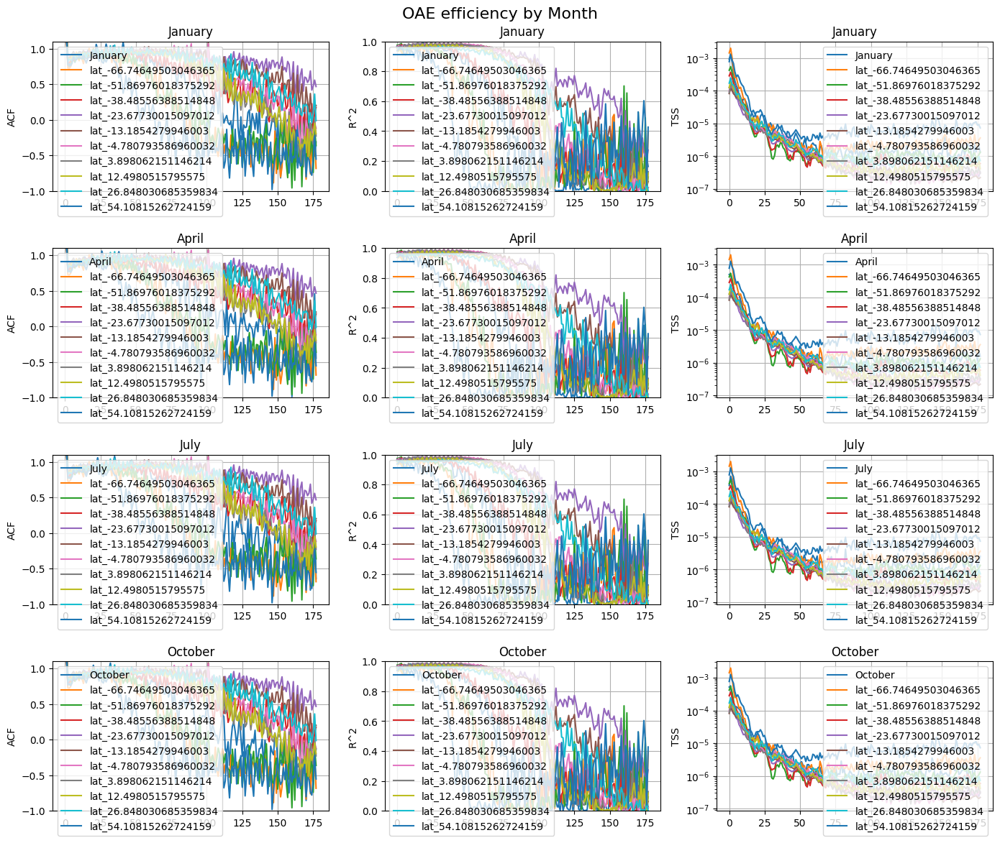

In [8]:
fig, ax = plt.subplots(4, 3, figsize=(14, 12))
fig.suptitle("OAE efficiency by Month", fontsize=16)

for i, month in enumerate(month_tuple):
    ax[i, 0].plot(acf_term_structure_df[month.lower()], label=month)
    ax[i, 0].set_title(month)
    ax[i, 0].grid(True)
    ax[i, 0].set_ylim(-1, 1.1)
    ax[i, 0].set_ylabel("ACF")
    ax[i, 1].plot(r_sq_term_structure_df[month.lower()], label=month)
    ax[i, 1].set_title(month)
    ax[i, 1].grid(True)
    ax[i, 1].set_ylim(0, 1)
    ax[i, 1].set_ylabel("R^2")
    ax[i, 2].plot(tss_term_structure_df[month.lower()], label=month)
    ax[i, 2].set_title(month)
    ax[i, 2].grid(True)
    ax[i, 2].set_ylabel("TSS")
    for lat_bucket in lat_buckets:
        avg_lat = np.mean(lat_bucket)   
        ax[i, 0].plot(acf_term_structure_df[f"lat_{avg_lat}"], label=f"lat_{avg_lat}")
        ax[i, 1].plot(r_sq_term_structure_df[f"lat_{avg_lat}"], label=f"lat_{avg_lat}")
        ax[i, 2].plot(tss_term_structure_df[f"lat_{avg_lat}"], label=f"lat_{avg_lat}")
for i in range(4):
    ax[i, 2].set_yscale("log")
    ax[i, 0].legend()
    ax[i, 1].legend()
    ax[i, 2].legend()
plt.tight_layout()
plt.show()

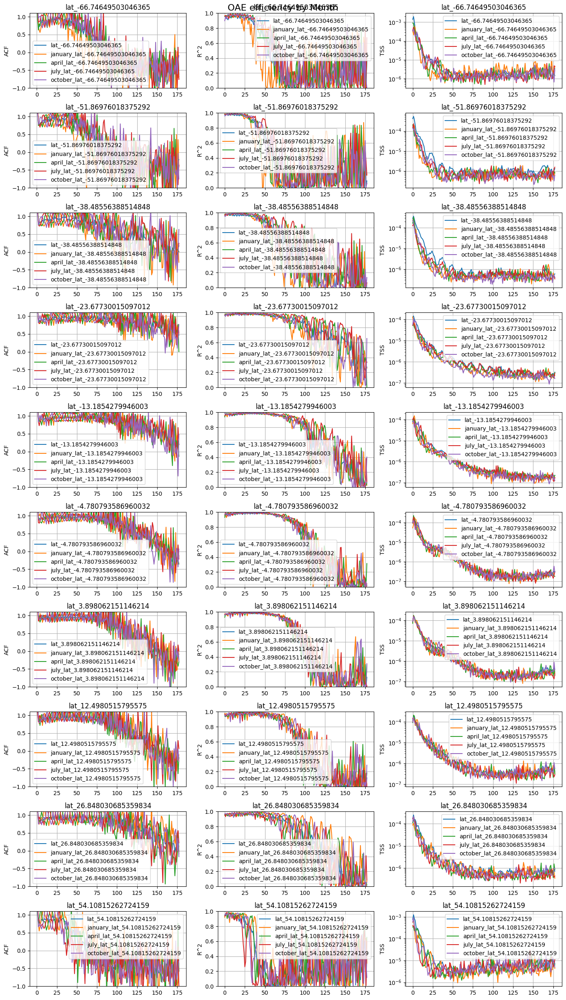

In [9]:
fig, ax = plt.subplots(lat_bucket_num, 3, figsize=(14, 25))
fig.suptitle("OAE efficiency by Month", fontsize=16)

for i, lat_bucket in enumerate(lat_buckets):
    avg_lat = np.mean(lat_bucket)
    ax[i, 0].plot(acf_term_structure_df[f"lat_{avg_lat}"], label=f"lat_{avg_lat}")
    ax[i, 0].set_title(f"lat_{avg_lat}")
    ax[i, 0].grid(True)
    ax[i, 0].set_ylim(-1, 1.1)
    ax[i, 0].set_ylabel("ACF")
    ax[i, 1].plot(r_sq_term_structure_df[f"lat_{avg_lat}"], label=f"lat_{avg_lat}")
    ax[i, 1].set_title(f"lat_{avg_lat}")
    ax[i, 1].grid(True)
    ax[i, 1].set_ylim(0, 1)
    ax[i, 1].set_ylabel("R^2")
    ax[i, 2].plot(tss_term_structure_df[f"lat_{avg_lat}"], label=f"lat_{avg_lat}")
    ax[i, 2].set_title(f"lat_{avg_lat}")
    ax[i, 2].grid(True)
    ax[i, 2].set_ylabel("TSS")
    for month in month_tuple:
        ax[i, 0].plot(acf_term_structure_df[f"{month.lower()}_lat_{avg_lat}"], label=f"{month.lower()}_lat_{avg_lat}")
        ax[i, 1].plot(r_sq_term_structure_df[f"{month.lower()}_lat_{avg_lat}"], label=f"{month.lower()}_lat_{avg_lat}")
        ax[i, 2].plot(tss_term_structure_df[f"{month.lower()}_lat_{avg_lat}"], label=f"{month.lower()}_lat_{avg_lat}")
for i in range(lat_bucket_num):
    ax[i, 2].set_yscale("log")
    ax[i, 0].legend()
    ax[i, 1].legend()
    ax[i, 2].legend()
plt.tight_layout()
plt.show()

In [10]:
oae_diffed = oae_diffed.loc[2:]

In [11]:
X_t0 = oae_diffed.iloc[:-1].to_numpy().flatten()
X_t1 = oae_diffed.iloc[1:].to_numpy().flatten()
finite_mask = np.isfinite(X_t0) & np.isfinite(X_t1)

In [12]:
cal_month = (
    oae_diffed.index.to_numpy()[:,np.newaxis] + oae_diffed.columns.get_level_values(2).map({"January": 1, "April": 4, "July": 7, "October": 10}).to_numpy()[np.newaxis,:]
)[:-1].flatten() % 12

In [13]:
season = np.abs(cal_month - 6)
season = 2 * season / season.max() - 1

(array([4642533.,       0., 9285066.,       0., 9285066.,       0.,
        9285066.,       0., 9285066.,       0., 9285066., 4642533.]),
 array([-1.        , -0.83333333, -0.66666667, -0.5       , -0.33333333,
        -0.16666667,  0.        ,  0.16666667,  0.33333333,  0.5       ,
         0.66666667,  0.83333333,  1.        ]),
 <BarContainer object of 12 artists>)

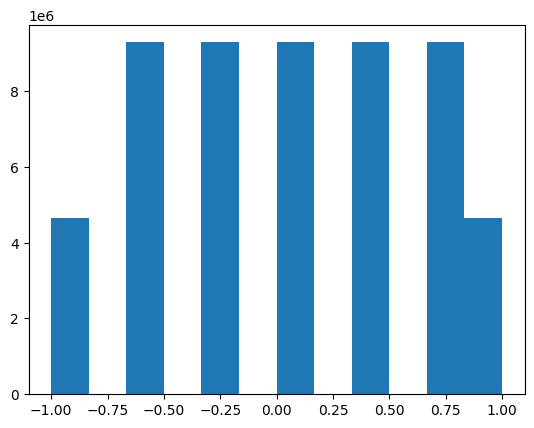

In [24]:
plt.hist(season, bins=12)

In [14]:
latitude = np.tile(oae_diffed.columns.get_level_values(0).to_numpy().round(1), len(oae_diffed) - 1)
time = np.repeat(oae_diffed.index.to_numpy()[:-1], len(oae_diffed.columns))
time = time / time.max()

In [15]:
a_bound = [0, 1.5]
b_bound = [0, 100]
c_bound = [-5, 0]
d_bound = [-1, 1]
e_bound = [-0.5, 0.5]

def ar_model(
        X: np.ndarray,
        a: float,
        b: float,
        c: float,
        d: float,
        e: float,
    ) -> np.ndarray:
    return (a / (1 + np.exp(b*(X[:, 0] + c))) + d + e*X[:, 1]) * X[:, 2]

unique_latitude = np.unique(latitude)
optimal_params = np.zeros((len(unique_latitude), 5))
r_sq = np.zeros(len(unique_latitude))
popt = [1, 1, -0.5, 0, 0]
for i, lat in enumerate(unique_latitude):
    print(f"Fitting for latitude = {lat:.1f}")
    lat_bw = 1.0
    mask = (lat - lat_bw <= latitude) & (latitude <= lat + lat_bw) & finite_mask
    X = np.column_stack((time[mask], season[mask], X_t0[mask]))
    popt, pcov = curve_fit(
        ar_model,
        X,
        X_t1[mask],
        p0=popt,
        bounds=(
            [a_bound[0], b_bound[0], c_bound[0], d_bound[0], e_bound[0]],
            [a_bound[1], b_bound[1], c_bound[1], d_bound[1], e_bound[1]],
        ),
    )
    optimal_params[i] = popt
    residuals = X_t1[mask] - ar_model(X, *popt)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((X_t1[mask] - np.mean(X_t1[mask]))**2)
    r_sq[i] = 1 - (ss_res / ss_tot)

Fitting for latitude = -78.2
Fitting for latitude = -77.6
Fitting for latitude = -77.1
Fitting for latitude = -76.5
Fitting for latitude = -76.0
Fitting for latitude = -75.5
Fitting for latitude = -74.9
Fitting for latitude = -74.4
Fitting for latitude = -73.9
Fitting for latitude = -73.3
Fitting for latitude = -72.8
Fitting for latitude = -72.3
Fitting for latitude = -71.7
Fitting for latitude = -71.2
Fitting for latitude = -70.7
Fitting for latitude = -70.1
Fitting for latitude = -69.6
Fitting for latitude = -69.1
Fitting for latitude = -68.5
Fitting for latitude = -68.0
Fitting for latitude = -67.5
Fitting for latitude = -66.9
Fitting for latitude = -66.4
Fitting for latitude = -65.9
Fitting for latitude = -65.3
Fitting for latitude = -64.8
Fitting for latitude = -64.3
Fitting for latitude = -63.7
Fitting for latitude = -63.2
Fitting for latitude = -62.7
Fitting for latitude = -62.1
Fitting for latitude = -61.6
Fitting for latitude = -61.1
Fitting for latitude = -60.5
Fitting for la

In [16]:
lam = 2000
optimal_param_0_spl = make_smoothing_spline(unique_latitude, optimal_params[:, 0], lam=lam)
optimal_param_1_spl = make_smoothing_spline(unique_latitude, optimal_params[:, 1], lam=lam)
optimal_param_2_spl = make_smoothing_spline(unique_latitude, optimal_params[:, 2], lam=lam)
optimal_param_3_spl = make_smoothing_spline(unique_latitude, optimal_params[:, 3], lam=lam)
optimal_param_4_spl = make_smoothing_spline(unique_latitude, optimal_params[:, 4], lam=lam)

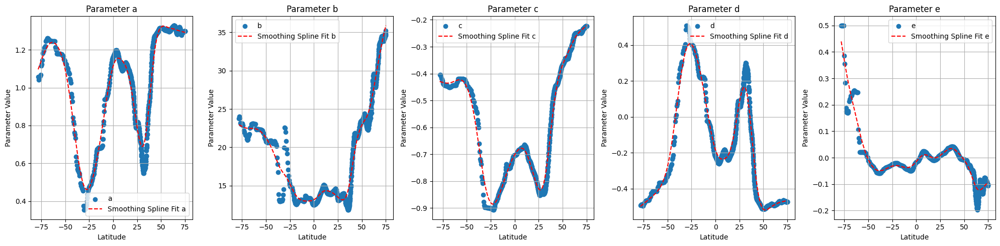

In [17]:
fig, ax = plt.subplots(1, 5, figsize=(20, 5))
ax[0].scatter(unique_latitude, optimal_params[:, 0], label="a")
ax[0].plot(unique_latitude, optimal_param_0_spl(unique_latitude), color='red', linestyle='--', label='Smoothing Spline Fit a')
ax[0].set_title("Parameter a")

ax[1].scatter(unique_latitude, optimal_params[:, 1], label="b")
ax[1].plot(unique_latitude, optimal_param_1_spl(unique_latitude), color='red', linestyle='--', label='Smoothing Spline Fit b')
ax[1].set_title("Parameter b")

ax[2].scatter(unique_latitude, optimal_params[:, 2], label="c")
ax[2].plot(unique_latitude, optimal_param_2_spl(unique_latitude), color='red', linestyle='--', label='Smoothing Spline Fit c')
ax[2].set_title("Parameter c")

ax[3].scatter(unique_latitude, optimal_params[:, 3], label="d")
ax[3].plot(unique_latitude, optimal_param_3_spl(unique_latitude), color='red', linestyle='--', label='Smoothing Spline Fit d')
ax[3].set_title("Parameter d")

ax[4].scatter(unique_latitude, optimal_params[:, 4], label="e")
ax[4].plot(unique_latitude, optimal_param_4_spl(unique_latitude), color='red', linestyle='--', label='Smoothing Spline Fit e')
ax[4].set_title("Parameter e")

for i in range(5):
    ax[i].set_xlabel("Latitude")
    ax[i].set_ylabel("Parameter Value")
    ax[i].grid(True)
    ax[i].legend()
plt.tight_layout()
plt.show()

$X_{t+1} = (\frac{a}{1 + exp(b*(time + c))} + d + e*season) * X_{t} + \sigma_t \varepsilon_t$

In [18]:
a_bound = [0, 1.5]
b_bound = [0, 100]
c_bound = [-5, 0]
d_bound = [-1, 1]

def ar_model(
        X: np.ndarray,
        a: float,
        b: float,
        c: float,
        d: float,
    ) -> np.ndarray:
    return (a / (1 + np.exp(b*(X[:, 0] + c))) + d) * X[:, 1]

r_sq_0 = np.zeros(len(unique_latitude))
popt = [1, 1, -0.5, 0]
for i, lat in enumerate(unique_latitude):
    print(f"Fitting for latitude = {lat:.1f}")
    lat_bw = 1.0
    mask = (lat - lat_bw <= latitude) & (latitude <= lat + lat_bw) & finite_mask
    X = np.column_stack((time[mask], X_t0[mask]))
    popt, pcov = curve_fit(
        ar_model,
        X,
        X_t1[mask],
        p0=popt,
        bounds=(
            [a_bound[0], b_bound[0], c_bound[0], d_bound[0]],
            [a_bound[1], b_bound[1], c_bound[1], d_bound[1]],
        ),
    )
    residuals = X_t1[mask] - ar_model(X, *popt)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((X_t1[mask] - np.mean(X_t1[mask]))**2)
    r_sq_0[i] = 1 - (ss_res / ss_tot)

Fitting for latitude = -78.2
Fitting for latitude = -77.6
Fitting for latitude = -77.1
Fitting for latitude = -76.5
Fitting for latitude = -76.0
Fitting for latitude = -75.5
Fitting for latitude = -74.9
Fitting for latitude = -74.4
Fitting for latitude = -73.9
Fitting for latitude = -73.3
Fitting for latitude = -72.8
Fitting for latitude = -72.3
Fitting for latitude = -71.7
Fitting for latitude = -71.2
Fitting for latitude = -70.7
Fitting for latitude = -70.1
Fitting for latitude = -69.6
Fitting for latitude = -69.1
Fitting for latitude = -68.5
Fitting for latitude = -68.0
Fitting for latitude = -67.5
Fitting for latitude = -66.9
Fitting for latitude = -66.4
Fitting for latitude = -65.9
Fitting for latitude = -65.3
Fitting for latitude = -64.8
Fitting for latitude = -64.3
Fitting for latitude = -63.7
Fitting for latitude = -63.2
Fitting for latitude = -62.7
Fitting for latitude = -62.1
Fitting for latitude = -61.6
Fitting for latitude = -61.1
Fitting for latitude = -60.5
Fitting for la

Text(0.5, 1.0, 'R-squared Values by Latitude')

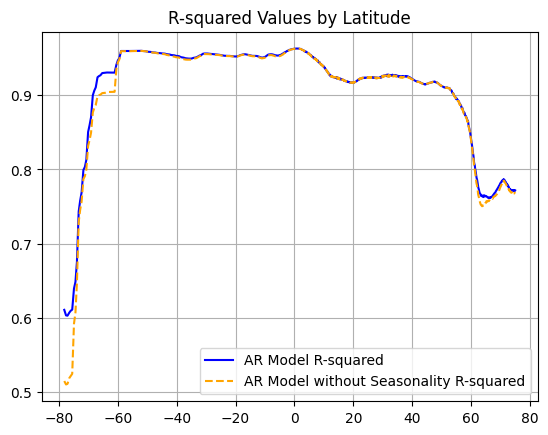

In [28]:
plt.plot(unique_latitude, r_sq, linestyle='-', color='blue', label='AR Model R-squared')
plt.plot(unique_latitude, r_sq_0, linestyle='--', color='orange', label='AR Model without Seasonality R-squared')
plt.grid()
plt.legend()
plt.title("R-squared Values by Latitude")

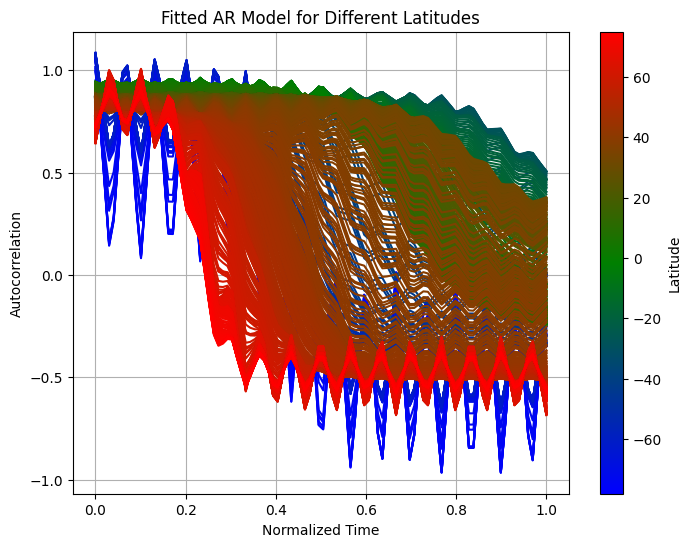

In [20]:
time_x = np.linspace(0, 1, 100)
month_x = np.abs((time_x * 180) % 12 - 6)
month_x = 2 * month_x / month_x.max() - 1

norm = mcolors.Normalize(vmin=unique_latitude.min(), vmax=unique_latitude.max())
cmap = LinearSegmentedColormap.from_list("three_color", ["blue", "green", "red"])

fig, ax = plt.subplots(figsize=(8,6))

for i, lat in enumerate(unique_latitude):
    color = cmap(norm(lat))
    y = optimal_params[i, 0] / (1 + np.exp(optimal_params[i, 1] * (time_x + optimal_params[i, 2]))) + optimal_params[i, 3] + optimal_params[i, 4] * month_x
    ax.plot(time_x, y, color=color, label=f'{lat:.1f}')

ax.set_title("Fitted AR Model for Different Latitudes")
ax.set_xlabel("Normalized Time")
ax.set_ylabel("Autocorrelation")
ax.grid(True)

# Add colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, label="Latitude")

plt.show()

In [21]:
# Create meshgrid-like 2D arrays
time_grid = np.tile(time_x, (len(unique_latitude), 1))  # shape (lat, time)
month_grid = np.tile(month_x, (len(unique_latitude), 1))  # shape (lat, time)
lat_grid = np.tile(unique_latitude[:, np.newaxis], (1, len(time_x)))  # shape (lat, time)

# Compute Z values (your sigmoid formula)
z_grid = np.zeros_like(time_grid)
for i, lat in enumerate(unique_latitude):
    a, b, c, d, e = optimal_params[i]
    z_grid[i, :] = a / (1 + np.exp(b * (time_x + c))) + d + e * month_x

# Create a 3D surface plot
fig = go.Figure(data=[go.Surface(
    x=time_grid,
    y=lat_grid,
    z=z_grid,
    colorscale='RdYlBu_r',  # Approx blue-green-red
    colorbar=dict(title="Autocorrelation")
)])

fig.update_layout(
    title='Interactive 3D AR Model Fit',
    scene=dict(
        xaxis_title='Normalized Time',
        yaxis_title='Latitude',
        zaxis_title='Autocorrelation'
    ),
    autosize=True,
    margin=dict(l=50, r=50, b=50, t=50)
)

fig.show()

In [22]:
# Create meshgrid-like 2D arrays
time_grid = np.tile(time_x, (len(unique_latitude), 1))  # shape (lat, time)
month_grid = np.tile(month_x, (len(unique_latitude), 1))  # shape (lat, time)
lat_grid = np.tile(unique_latitude[:, np.newaxis], (1, len(time_x)))  # shape (lat, time)

# Compute Z values (your sigmoid formula)
z_grid = np.zeros_like(time_grid)
for i, lat in enumerate(unique_latitude):
    a, b, c, d, e = optimal_param_0_spl(lat), optimal_param_1_spl(lat), optimal_param_2_spl(lat), optimal_param_3_spl(lat), optimal_param_4_spl(lat)
    z_grid[i, :] = a / (1 + np.exp(b * (time_x + c))) + d + e * month_x

# Create a 3D surface plot
fig = go.Figure(data=[go.Surface(
    x=time_grid,
    y=lat_grid,
    z=z_grid,
    colorscale='RdYlBu_r',  # Approx blue-green-red
    colorbar=dict(title="Autocorrelation")
)])

fig.update_layout(
    title='Interactive 3D AR Model Fit',
    scene=dict(
        xaxis_title='Normalized Time',
        yaxis_title='Latitude',
        zaxis_title='Autocorrelation'
    ),
    autosize=True,
    margin=dict(l=50, r=50, b=50, t=50)
)

fig.show()